<span style="color:red">FIXME: add instructions block and edit photo upload section based on conditions. Test the collaborative stuff i </span>

# Introduction to Jupyter notebooks

This semester's ME305 labs will reside in [Jupyter notebooks](https://jupyter.org) like this one. You can run all of the notebooks in a browser with Google Colab without installing anything -- that's best for our purposes. If you're interested, however, you can install [Anaconda](https://jupyter.readthedocs.io/en/latest/install.html#installing-jupyter-using-anaconda-and-conda), then follow the instructions to intall Jupyter locally.

Jupyter notebooks contain computer code (Python) and rich text elements (paragraphs, equations, figures, links, etc…). You won't need much coding knowledge, but this notebook will provide a very limited intro to some of the features you'll need to use for labs.

##  Part 1: Markdown cells ##
Blocks like this one, which show formatted text, are Markdown cells. (Optional/for future reference: Learn more about [Markdown formatting](https://jupyter-notebook.readthedocs.io/en/stable/examples/Notebook/Working%20With%20Markdown%20Cells.html).)

Double click in this cell to edit. Delete the HTML lines and type something in the blank space below:


<p>&nbsp;</p>
<p>&nbsp;</p>
<p>&nbsp;</p>


... and press SHIFT + ENTER to run this markdown cell.

You can also type equations, using [LATeX](http://www.onemathematicalcat.org/MathJaxDocumentation/TeXSyntax.htm) syntax, e.g. 

$\sigma = \frac{PL}{EA}$


Now, create a new markdown cell below this. In Colab, click "+Text" at the top of the screen. Type something else, including an equation, and run the cell.

## Part 2: Code cells

Below is a Code cell which will install and load the Python libraries we need. This is usually the first thing in a Jupyter nb. Note that within a code cell, you can create a comment with the "#" symbol.


````
# this is a comment 
````

Press SHIFT + ENTER to run the code cell below:

In [18]:
install2_mpld3 = !pip install "git+https://github.com/javadba/mpld3@display_fix" 
import matplotlib.pyplot as plt   # for plotting
import numpy as np                # for arrays
import pandas as pd               # for data/tables
from skimage import io            # working with images
from IPython.display import Image,display # images in colab
import mpld3                      # interacting with images
from mpld3 import plugins         # getting pixel data from images
import os                         # navigating through files

### Basic math

For convenience, you may want to do some [basic mathematical operations](https://en.wikibooks.org/wiki/Python_Programming/Basic_Math) in your code cells. 

The cell below will print the result of $\mid (\frac{2-3}{5 \cdot 6})^{1/3} \mid$.

In [9]:
abs(((2-3)/(5*6))**(1/3)) # Note, "to the power of" is **

0.32182979486854324

You could also perform mathematical operations with variables.

In [25]:
radius = 5
circumference = 2*np.pi*radius # Note, we use np.pi for pi.
area = np.pi*radius**2 
area 

78.53981633974483

### Print statements

If you want more than one result for a single code cell, you can use print statements.

Note that printing text (strings) requires single or double quotes.

In [26]:
print(area)
print(circumference)
print('Hello world')
print("Hello again, world")

78.53981633974483
31.41592653589793
Hello world
Hello again, world


### DataFrames with Pandas

The [Pandas DataFrame](https://realpython.com/pandas-dataframe/#introducing-the-pandas-dataframe) is a structure that contains two-dimensional data (think a matrix of rows and columns) with corresponding labels. It's a convenient way to store and organize data. 

You can [create DataFrames](https://www.geeksforgeeks.org/creating-a-pandas-dataframe/) a variety of ways. Here, we'll make <i>lists</i>, label the lists via a <i>dictionary</i>, and turn that dictionary into a DataFrame.

We already ran the necessary statement

````
import pandas as pd 
````

so we can begin working with the Pandas package.

In [56]:
force_list = [0,1,2,3,4,5] # make a list
force_list.append(6) # add an entry to the end of the list
print(force_list) # print to make sure "append" worked...
displacement_list = [0,0.5,1.0,1.5,2.0,2.5,3.0] # make another list
print(len(force_list), len(displacement_list)) 
# we can only make a dataframe if the lists are the same length -- let's check.

d = {'force':force_list,'displacement':displacement_list} # this dictionary will become our dataframe. 
# the format is: {'name of column':data in column,...}
df = pd.DataFrame(d) # make a dataframe out of the dictionary

df # see what the dataframe looks like

[0, 1, 2, 3, 4, 5, 6]
7 7


,force,displacement
0,0,0.0
1,1,0.5
2,2,1.0
3,3,1.5
4,4,2.0
5,5,2.5
6,6,3.0


Want to add columns to your dataframe?

In [144]:
df['time'] = [0,10,20,30,40,50,60] 
df['displacement_2'] = [0.0,1,2,3,4,5,6]
df.head(2) # check out only the first 2 rows.

,force,displacement,time,displacement_2
0,0,0.0,0,0.0
1,1,0.5,10,1.0


Need to delete a row?

In [145]:
newdf = df.drop([6]) # make a copy of this df where we drop row 6.
newdf # check it out

,force,displacement,time,displacement_2
0,0,0.0,0,0.0
1,1,0.5,10,1.0
2,2,1.0,20,2.0
3,3,1.5,30,3.0
4,4,2.0,40,4.0
5,5,2.5,50,5.0


We could have said 

```
df = df.drop([6])
``` 
instead of creating a new dataframe, but be careful because then we lose row 6 forever!

### Plotting with matplotlib

[Matplotlib](https://en.wikipedia.org/wiki/Matplotlib) is a MATLAB-esque plotting package. We've already loaded its plotting feature:

```
import matplotlib.pyplot as plt
```
so let's proceed, and plot some things from our dataframe.

There's some non-intuitive syntax involved. Don't worry about the details for now -- you can always adapt code. The basic structure is this:

``` 
fig, ax = plt.subplots()
dataframe.plot.scatter('x column','y column',ax=ax)
plt.show()
```

and we'll explore a few aditional options below.

For more on plotting, see the Appendix.

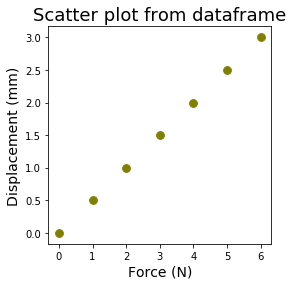

In [148]:
fig, ax = plt.subplots(figsize=(4,4)) # create a figure whose size is 4x4.
df.plot.scatter('force','displacement',s=60,c='olive',ax=ax) # scatter plot of 2 
# df columns against one another. Make the markers size 60 and olive, and place the plot
# in the figure we just created (ax=ax does this).
ax.set_xlabel('Force (N)',fontsize=14) # label the x-axis
ax.set_ylabel('Displacement (mm)',fontsize=14) # label the y-axis
ax.set_title('Scatter plot from dataframe',fontsize=18) # make a title
plt.show() 

## Part 3: Upload a photo

### Take a photo & save locally
You'll often be asked to take photos as you perform experiments. You'll then import them to your Jupyter notebook and work with them there.

Additionally, all members will collaborate on a single Jupyter notebook and possibly each have to upload their own photos. We'll practice that here, so please ** do the following before you proceed: **

- take a photo (you can use your cell phone, laptop camera, tablet...) of something around you related to ME305 (don't overthink this).
- save it to your Desktop (or another easily accessible location) with a descriptive name (e.g. 'spaghetti.jpg').

### Upload photos to this notebook

Now that your photo is saved locally, you will upload your photo to this notebook. 

**Copy & paste the cell below this one into new cells, one for each group member**. If you are in a group of 3, there should be 3 cells & 3 photos. 

**Each member should take the steps below.**

In Google Colab, there's an extra step to access your local files.  

1. On the left side of your screen, click the folder icon. 

2. Next, click the Upload button. Find the image you just saved, and click Choose. You should see your filename in the panel on the left.

3. Hover the mouse to the right (over your filename) until you see 3 dots. Click, and select "Copy Path". 

4. Now, run the next cell and paste (CTRL + V) the path when prompted.

Aside: If you run this code later in a Jupyter Notebook via Anaconda, you'll type the file path (no quotes) when prompted, which probably looks like:

````
/Users/yourname/Desktop/yourimage.jpg
````

<p>&nbsp;</p>


In [159]:
path = str(input("Paste or type your file path: ")) # IF YOU DON'T WANT TO BE PROMPTED, comment this line out,
# path = '/file/path/here' # ... & uncomment this one, adding your file path in single or double quotes.

im = io.imread(path) # read the image 

fig, ax = plt.subplots(figsize=(7,7)) # create a figure
io.imshow(im) # "plot" the figure 
plugins.connect(fig, plugins.MousePosition(fontsize=14)) # when you hover the pointer over the photo, 
# you'll see the (x,y) pixel coordinates.
mpld3.display() 

Paste or type your file path: /Users/lsmontal/Desktop/LuciaMerlefest.jpg


You may notice the axis coordinates and the (x,y) pixel values in the bottom right corner. This is due to the last 2 lines of code above, from the package mpld3. We'll use this feature in future labs to take measurements. For now, just make sure you can see the (x,y) values (and let your TA know if not!)

If you have a photo for each group member above, you can check out the Appendix to learn about some more plot options that may be helpful. Otherwise, you're done.

## Appendix: more on plotting 

Nicely arranged subplots, plotting lists (instead of df columns), and some more plot options (for future reference if nothing else).

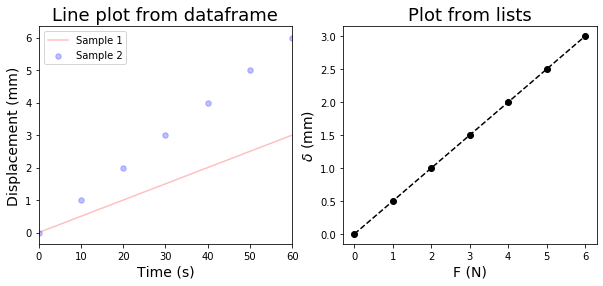

In [158]:
fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(10,4)) # make 2 figures arranged side-by-side.
# now "ax" is an array, i.e. ax = [ax[0], ax[1]]. 
# so we'll place the first plot in ax[0] the same way as before
df.plot.line('time','displacement',c='red',alpha=0.25,ax=ax[0],label='Sample 1') # line plot with 25% opacity ("alpha=0.25" does this)
# the labels are for the legend.
df.plot.scatter('time','displacement_2',c='blue',s=30,alpha=0.25,ax=ax[0],label='Sample 2') 
ax[0].set_xlabel('Time (s)',fontsize=14)
ax[0].set_ylabel('Displacement (mm)',fontsize=14) 
ax[0].set_title('Line plot from dataframe',fontsize=18)
ax[0].legend(loc='upper left') # create & place the legend.

# rather than plotting dataframe columns, you could also plot 2 lists against one another. The syntax is different:
ax[1].plot(force_list,displacement_list,'ko--') # to plot from a list, use ax.plot(x,y,marker options). 
# the marker options here are 'ko-', which says 'k' for black + 'o--' as the marker type.
ax[1].set_xlabel('F (N)',fontsize=14)
ax[1].set_ylabel('$\delta$ (mm)',fontsize=14) 
ax[1].set_title('Plot from lists',fontsize=18)

plt.show()